In [ ]:
import torch
print(torch.cuda.is_available())  # Should return True
print(torch.cuda.get_device_name(0))  # Should show 'Tesla T4'


True
Tesla T4


In [ ]:
!pip install torch torchvision transformers requests pillow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 868.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [2]:
import requests
import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection


In [3]:
# Define model and device
model_id = "IDEA-Research/grounding-dino-tiny"
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load processor and model
processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/457 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/82.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.64k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/689M [00:00<?, ?B/s]

In [5]:
import os
from PIL import Image

# Define dataset path
dataset_folder = "/content/dataset_folder/data_"

# Get a sorted list of image files (assuming JPG format)
image_files = sorted([f for f in os.listdir(dataset_folder) if f.endswith(".jpg")])[:10]  # Only first 10 images

# Iterate through all images and display them
for image_name in image_files:
    image_path = os.path.join(dataset_folder, image_name)
    image = Image.open(image_path).convert("RGB")
    image.show()  # Display image in Colab
    print(f"Displayed: {image_name}")


Displayed: stream0_1743481076.jpg
Displayed: stream0_1743481991.jpg
Displayed: stream0_1743482084.jpg
Displayed: stream0_1743482173.jpg
Displayed: stream0_1743482213.jpg
Displayed: stream0_1743482219.jpg
Displayed: stream0_1743482221.jpg
Displayed: stream0_1743482506.jpg
Displayed: stream0_1743482776.jpg
Displayed: stream2_1743481992.jpg


In [4]:
import zipfile
import os
import pandas as pd
import json

# Step 1: Unzip the file
zip_file_path = "/content/data_.zip"  # Change this to your ZIP file path
extract_to = "/content/dataset_folder"  # Folder to extract contents

# Extract ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"✅ Unzipped to: {extract_to}")

# Step 2: List all files inside
file_list = os.listdir(extract_to)
print("\n📂 Files in the dataset folder:")
for file in file_list:
    print(" -", file)

# Step 3: Check if any CSV or JSON files are present
for file in file_list:
    file_path = os.path.join(extract_to, file)

    if file.endswith(".csv"):
        print(f"\n📄 Preview of {file}:")
        df = pd.read_csv(file_path)
        print(df.head())  # Show first few rows

    elif file.endswith(".json"):
        print(f"\n📄 Preview of {file}:")
        with open(file_path, "r") as f:
            data = json.load(f)
            print(json.dumps(data, indent=2)[:500])  # Print first 500 characters

✅ Unzipped to: /content/dataset_folder

📂 Files in the dataset folder:
 - data_


In [6]:
# Zero-shot object detection labels
text_labels = [["a remote control", "a human head", "a human hair", "eye glasses", "a safety jacket", "a mobile phone", "a safety helmet"]]


In [7]:
for image_name in image_files:
    image_path = os.path.join(dataset_folder, image_name)
    image = Image.open(image_path).convert("RGB")

    # Preprocess input
    inputs = processor(images=[image], text=text_labels, return_tensors="pt").to(device)

    # Run inference without gradient calculations
    with torch.no_grad():
        outputs = model(**inputs)

    print(f"Processed: {image_name}")


Processed: stream0_1743481076.jpg
Processed: stream0_1743481991.jpg
Processed: stream0_1743482084.jpg
Processed: stream0_1743482173.jpg
Processed: stream0_1743482213.jpg
Processed: stream0_1743482219.jpg
Processed: stream0_1743482221.jpg
Processed: stream0_1743482506.jpg
Processed: stream0_1743482776.jpg
Processed: stream2_1743481992.jpg


In [8]:
for image_name in image_files:
    image_path = os.path.join(dataset_folder, image_name)
    image = Image.open(image_path).convert("RGB")

    # Preprocess input
    inputs = processor(images=[image], text=text_labels, return_tensors="pt").to(device)

    # Run inference without gradient calculations
    with torch.no_grad():
        outputs = model(**inputs)

    # Convert outputs into human-readable results
    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        box_threshold=0.5,
        text_threshold=0.3,
        target_sizes=[image.size[::-1]]
    )

    # Display detected objects
    result = results[0]
    print(f"Results for {image_name}:")
    for box, score, label in zip(result["boxes"], result["scores"], result["labels"]):
        box = [round(x, 2) for x in box.tolist()]
        print(f"Detected {label} with confidence {round(score.item(), 3)} at location {box}")

    print("-" * 50)  # Separator for better readability


<ipython-input-8-ef3c0572efa6>:13: FutureWarning: `box_threshold` is deprecated and will be removed in version 4.51.0 for `GroundingDinoProcessor.post_process_grounded_object_detection`. Use `threshold` instead.
  results = processor.post_process_grounded_object_detection(
/usr/local/lib/python3.11/dist-packages/transformers/models/grounding_dino/processing_grounding_dino.py:95: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


Results for stream0_1743481076.jpg:
Detected a safety jacket with confidence 0.793 at location [1879.74, 526.61, 2199.66, 969.47]
Detected a human hair with confidence 0.606 at location [1938.69, 389.31, 2064.21, 473.3]
Detected a human head with confidence 0.736 at location [1935.81, 388.25, 2078.3, 581.72]
--------------------------------------------------
Results for stream0_1743481991.jpg:
Detected a safety jacket with confidence 0.694 at location [2297.82, 344.03, 2542.08, 658.87]
--------------------------------------------------
Results for stream0_1743482084.jpg:
Detected a safety jacket with confidence 0.828 at location [2228.7, 755.05, 2554.4, 1293.19]
Detected eye glasses with confidence 0.503 at location [2380.47, 663.25, 2524.01, 734.93]
Detected a safety helmet with confidence 0.517 at location [2363.25, 535.41, 2542.98, 707.68]
--------------------------------------------------
Results for stream0_1743482173.jpg:
Detected a safety jacket with confidence 0.815 at location

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches


<ipython-input-10-cdba49f8a102>:13: FutureWarning: `box_threshold` is deprecated and will be removed in version 4.51.0 for `GroundingDinoProcessor.post_process_grounded_object_detection`. Use `threshold` instead.
  results = processor.post_process_grounded_object_detection(


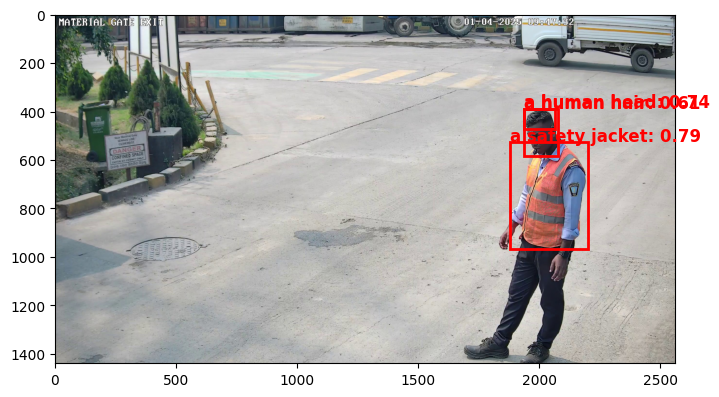

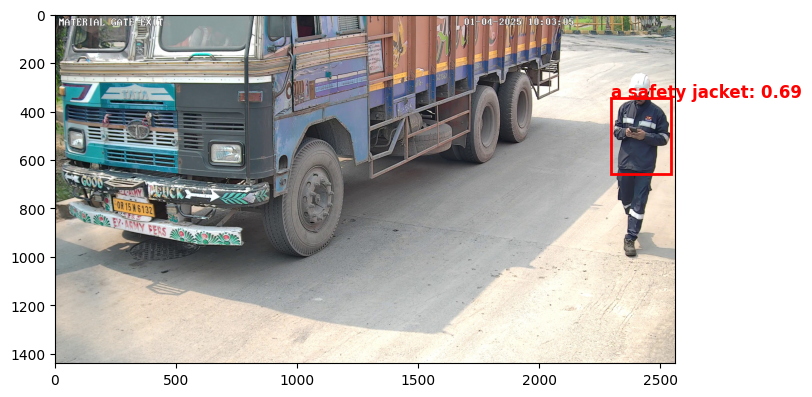

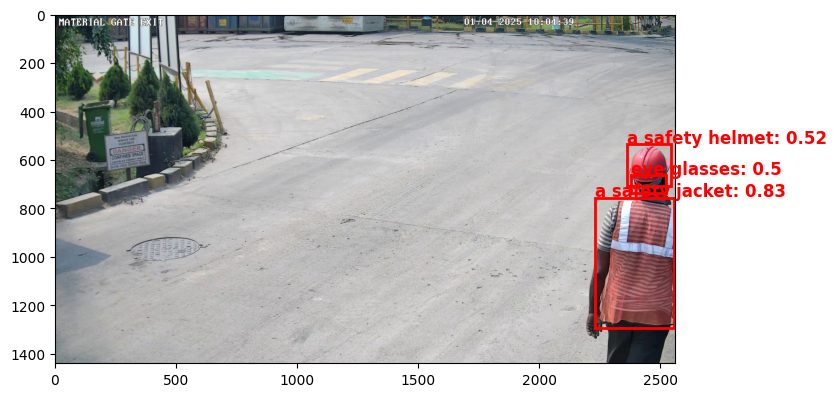

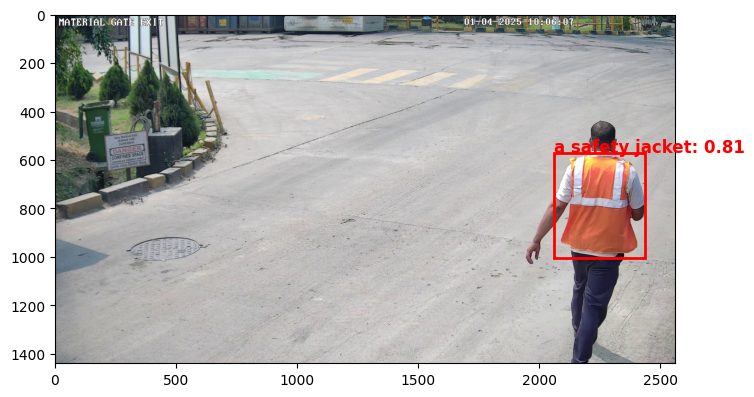

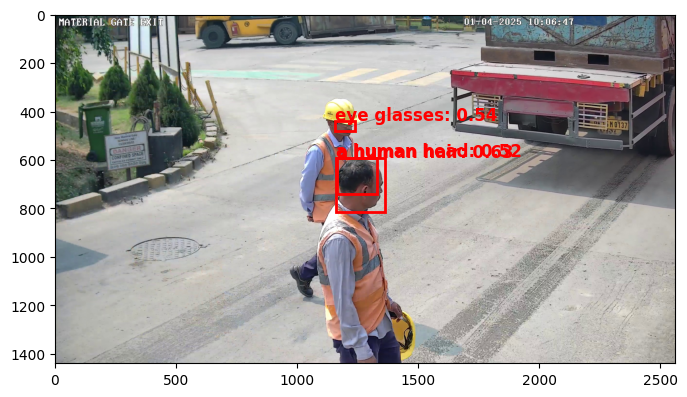

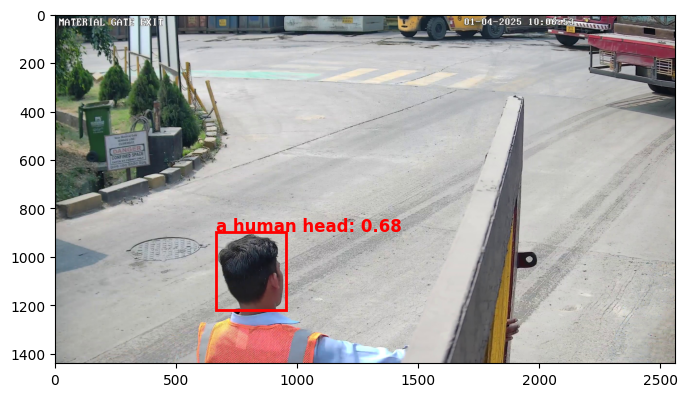

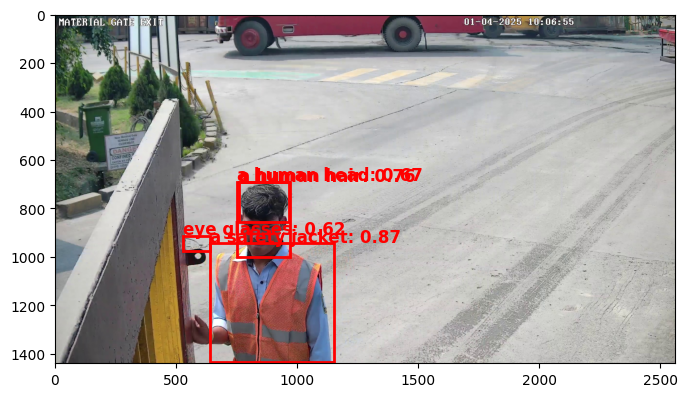

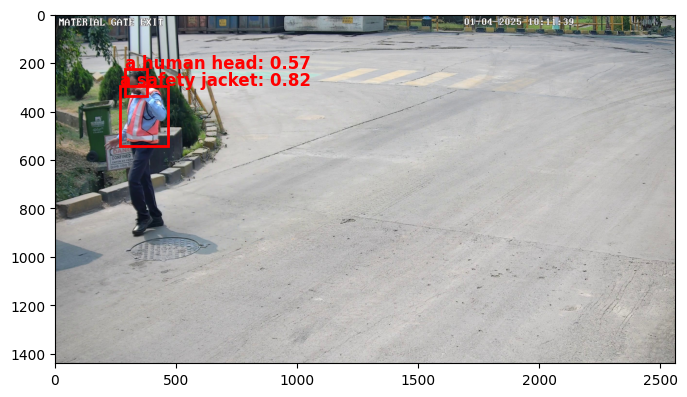

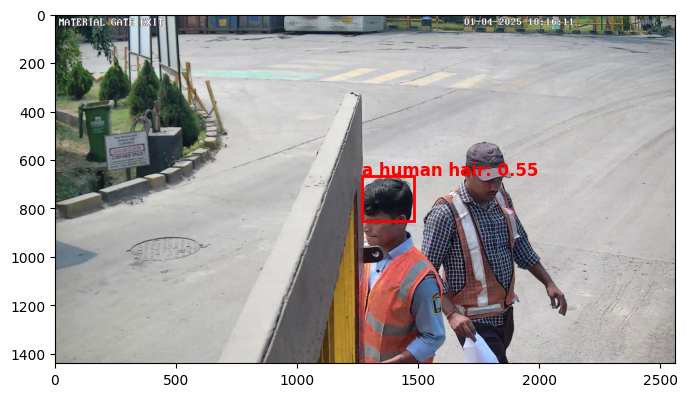

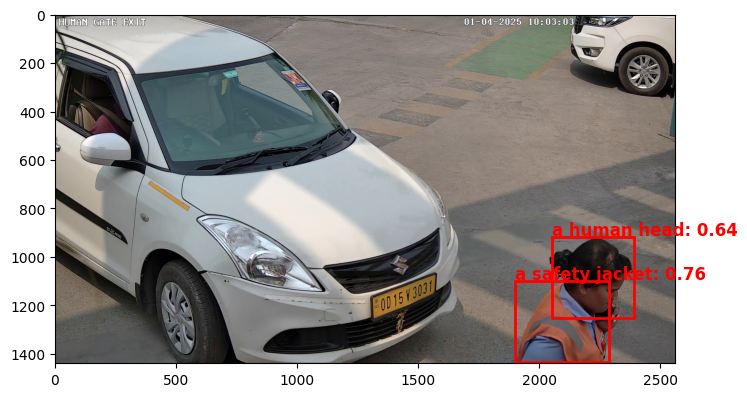

In [10]:
for image_name in image_files:
    image_path = os.path.join(dataset_folder, image_name)
    image = Image.open(image_path).convert("RGB")

    # Preprocess input
    inputs = processor(images=[image], text=text_labels, return_tensors="pt").to(device)

    # Run inference without gradient calculations
    with torch.no_grad():
        outputs = model(**inputs)

    # Convert outputs into human-readable results
    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        box_threshold=0.5,
        text_threshold=0.3,
        target_sizes=[image.size[::-1]]
    )

    # Display detected objects
    result = results[0]

    # Plot image
    fig, ax = plt.subplots(1, figsize=(8, 6))
    ax.imshow(image)

    # Draw bounding boxes
    for box, score, label in zip(result["boxes"], result["scores"], result["labels"]):
        x_min, y_min, x_max, y_max = box.tolist()
        width, height = x_max - x_min, y_max - y_min

        # Create a rectangle
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, f"{label}: {round(score.item(), 2)}", color='red', fontsize=12, fontweight='bold')

    plt.show()


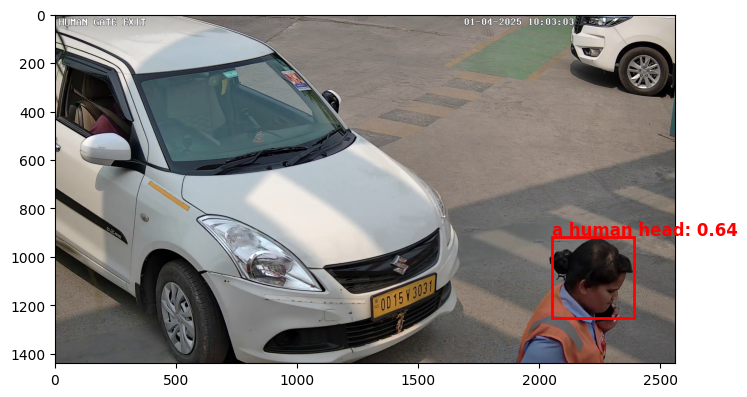

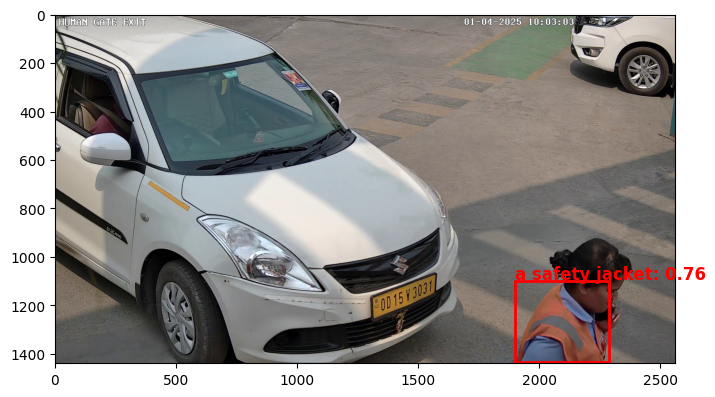

Bounding box coordinates saved to bounding_boxes.txt


In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Convert image to RGB (if needed)
image = image.convert("RGB")

# Define output text file
output_file = "bounding_boxes.txt"

# Open the file to write bounding box details
with open(output_file, "w") as f:
    for box, score, label in zip(result["boxes"], result["scores"], result["labels"]):
        x_min, y_min, x_max, y_max = box.tolist()
        width, height = x_max - x_min, y_max - y_min

        # Write to file
        f.write(f"{label}, {score.item()}, {x_min}, {y_min}, {x_max}, {y_max}\n")

        # Draw bounding box on the image
        fig, ax = plt.subplots(1, figsize=(8, 6))
        ax.imshow(image)
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, f"{label}: {round(score.item(), 2)}", color='red', fontsize=12, fontweight='bold')

plt.show()

print(f"Bounding box coordinates saved to {output_file}")


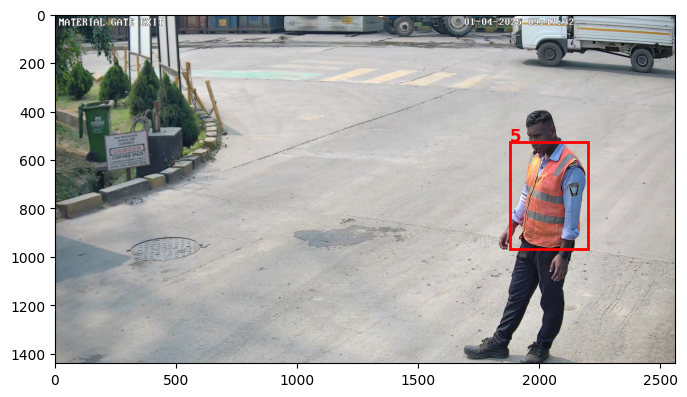

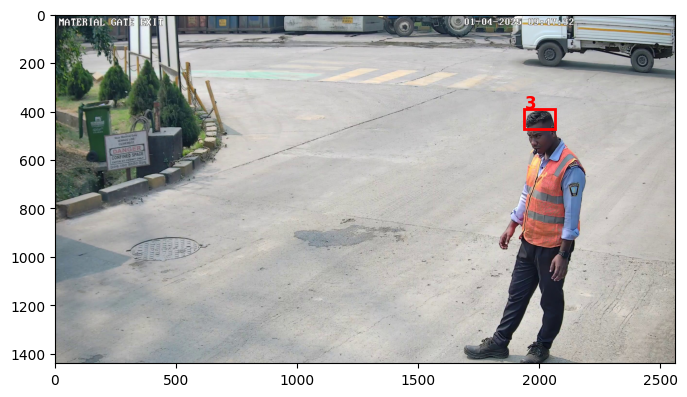

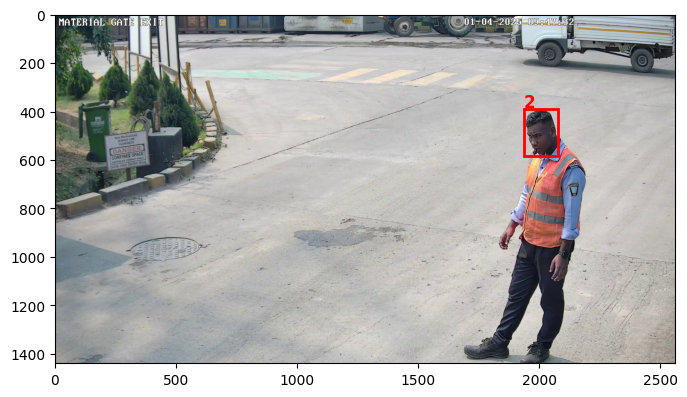

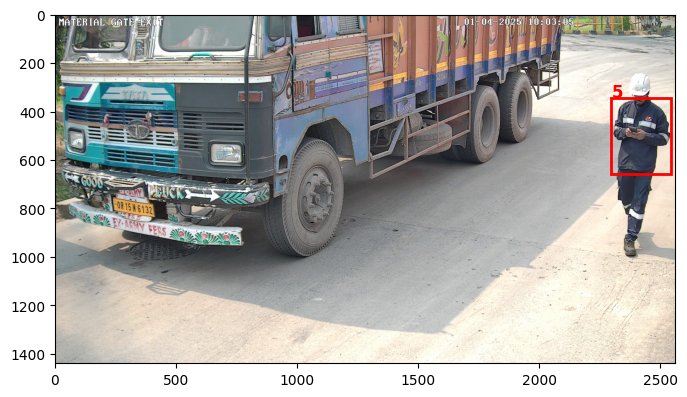

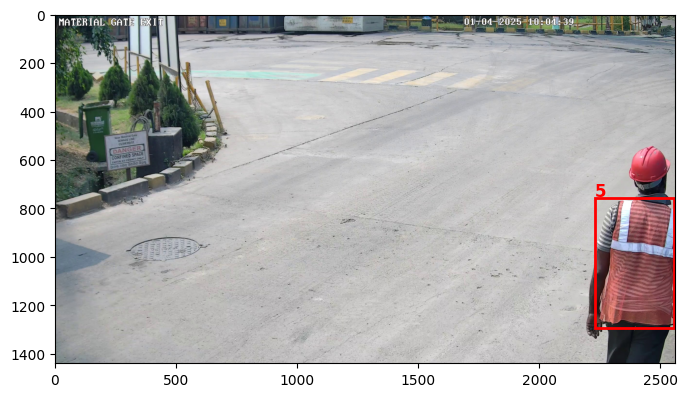

...

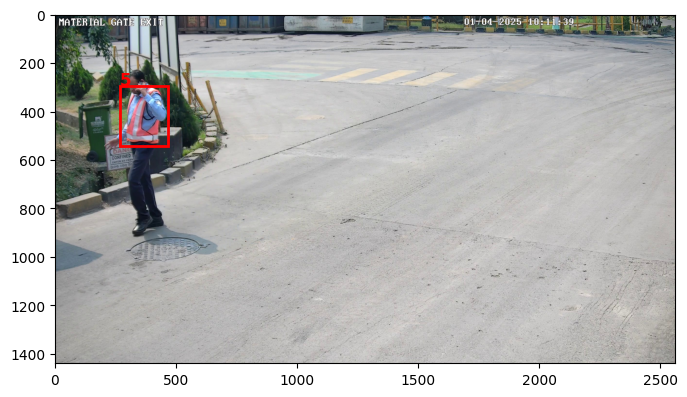

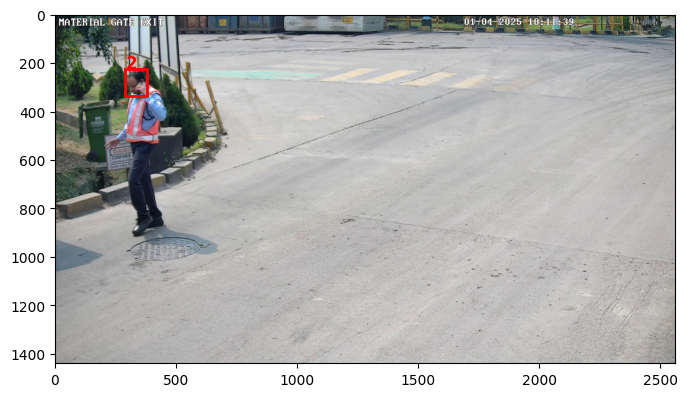

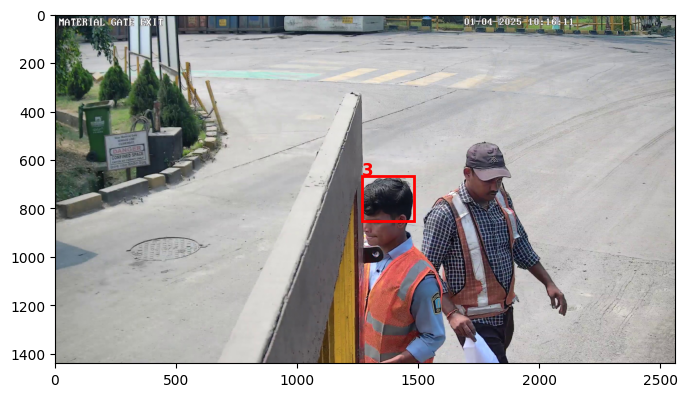

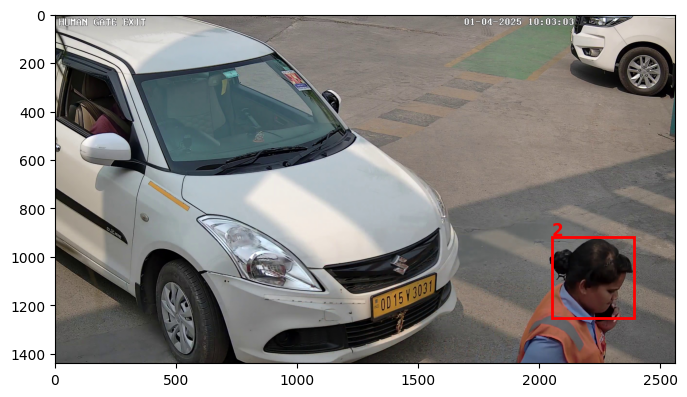

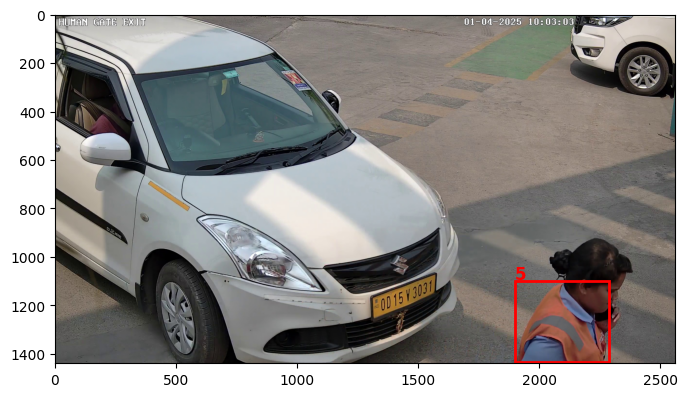

Bounding box coordinates saved in the 'bounding_boxes' folder.


In [13]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Define class mapping
class_mapping = {
    "a remote control": 1,
    "a human head": 2,
    "a human hair": 3,
    "eye glasses": 4,
    "a safety jacket": 5,
    "a mobile phone": 6,
    "a safety helmet": 7
}

# Create a directory for bounding box text files if it doesn't exist
output_folder = "bounding_boxes"
os.makedirs(output_folder, exist_ok=True)

# Process each image in the dataset
for image_name in image_files:
    image_path = os.path.join(dataset_folder, image_name)
    image = Image.open(image_path).convert("RGB")
    W, H = image.size  # Get image width and height

    # Preprocess input
    inputs = processor(images=[image], text=list(class_mapping.keys()), return_tensors="pt").to(device)

    # Run inference without gradient calculations
    with torch.no_grad():
        outputs = model(**inputs)

    # Convert outputs into human-readable results
    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        threshold=0.5,  # Use 'threshold' instead of 'box_threshold'
        text_threshold=0.3,
        target_sizes=[image.size[::-1]]
    )

    # Create a separate text file for each image
    output_file = os.path.join(output_folder, f"{os.path.splitext(image_name)[0]}.txt")

    with open(output_file, "w") as f:
        result = results[0]

        for box, label in zip(result["boxes"], result["labels"]):
            x_min, y_min, x_max, y_max = box.tolist()

            # Convert label text to class ID
            class_id = class_mapping.get(label, 0)  # Default to 0 if label not found

            # Convert to YOLO format (normalized)
            x_center = ((x_min + x_max) / 2) / W
            y_center = ((y_min + y_max) / 2) / H
            width = (x_max - x_min) / W
            height = (y_max - y_min) / H

            # Write YOLO format bounding box to file
            f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

            # Draw bounding box on the image
            fig, ax = plt.subplots(1, figsize=(8, 6))
            ax.imshow(image)
            rect = patches.Rectangle((x_min, y_min), (x_max - x_min), (y_max - y_min), linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(x_min, y_min - 5, f"{class_id}", color='red', fontsize=12, fontweight='bold')

            plt.show()

print(f"Bounding box coordinates saved in the '{output_folder}' folder.")
